## The color of roads

A problem facing the road surface classifier is the proper segmentation of the road in the image from other confusers: mainly vegetation. Luckily for us, roads tend to be a certain set of colors, and vegetation tends to be another set of colors. We can leverage this create a segmentation approach that can identify where the road is, and filter out obscuring foliage.

This approach will allow our segmentation model to understand the difference between the color of a road and the resulting background. Additionally, our classification model will be able to provide an estimation of how obscured the road is in a given image. This information is extraordinately useful as a means to express confidence in our classification result.

To support this analysis, I have gone through ~1000 road sample chips and labeled them by obscuration level, a scale of the road visibility. The values are as follows:

| Obscuration  |        Meaning             |
| ------------ | -------------------------- |
| -1           | Unlabeled data             |
| 0            | Unobscured                 |
| 1            | ~ 33% obscured             |
| 2            | ~ 67% obscured             |
| 3            | Nearly completely obscured |

I also included a `bad_detect` annotation such that we can filter imagery in which the OSM way matches up with the NAIP image nicely. Here we load as `pos_df` and `neg_df`, which are chips we will use for positive and negative color samples, respectively.

In [1]:
import sqlite3
import pandas as pd
from IPython.display import display

# Connect to sqlite database
with sqlite3.connect('file:/data/road_surface_classifier/features.sqlite3?mode=ro', uri=True) as con:
    cursor = con.cursor()

    # Get all truthed roadways with next-to-no obscuration that are valid
    cursor.execute("""
        SELECT osm_id, chip_path from features
        WHERE obscuration != -1 AND obscuration <= 1 AND no_data = 0 and bad_detect = 0
        GROUP BY chip_path HAVING COUNT(*) == 1;
    """)
    pos_rows = cursor.fetchall()

    # Get all truthed roadways with next-to-complete obscuration that are valid
    cursor = con.cursor()
    cursor.execute("""
        SELECT osm_id, chip_path from features
        WHERE obscuration != -1 AND obscuration == 3 AND no_data = 0 and bad_detect = 0
        GROUP BY chip_path HAVING COUNT(*) == 1;
    """)
    neg_rows = cursor.fetchall()

# Put this all in a dataframe
pos_df = pd.DataFrame(pos_rows, columns=['osm_id', 'chip_path']).set_index('osm_id')
neg_df = pd.DataFrame(neg_rows, columns=['osm_id', 'chip_path']).set_index('osm_id')

# Load OSM features and extract WKT values for the OSM IDs from above
osm_df = pd.read_csv('/data/road_surface_classifier/features.csv')

# Combine this with our original DataFrame to get a "super-duper" DataFrame with wkt values
pos_df = pd.concat([pos_df, osm_df.set_index('osm_id').loc[pos_df.index]['wkt']], axis=1)
neg_df = pd.concat([neg_df, osm_df.set_index('osm_id').loc[neg_df.index]['wkt']], axis=1)
display(pos_df)
display(neg_df)

,chip_path,wkt
osm_id,,
1000804590,/data/road_surface_classifier/imagery/10008045...,"LINESTRING (-95.5572233 29.7098035,-95.5572269..."
1005086973,/data/road_surface_classifier/imagery/10050869...,"LINESTRING (-73.727361 41.228755,-73.726615 41..."
10062629,/data/road_surface_classifier/imagery/10062629...,"LINESTRING (-97.1195594 32.7515292,-97.1232604..."
10104745,/data/road_surface_classifier/imagery/10104745...,"LINESTRING (-112.0564806 37.5358296,-112.05677..."
10105788,/data/road_surface_classifier/imagery/10105788...,"LINESTRING (-109.2941603 38.8600777,-109.29438..."
...,...,...
9923837,/data/road_surface_classifier/imagery/9923837.tif,"LINESTRING (-99.7169109 44.548138,-99.7169039 ..."
993076250,/data/road_surface_classifier/imagery/99307625...,"LINESTRING (-84.0206876 41.7834173,-84.0206981..."
994986166,/data/road_surface_classifier/imagery/99498616...,"LINESTRING (-78.3404717 43.2359061,-78.3404799..."


,chip_path,wkt
osm_id,,
1011552973,/data/road_surface_classifier/imagery/10115529...,"LINESTRING (-80.4775304 41.4970932,-80.4774311..."
1024597156,/data/road_surface_classifier/imagery/10245971...,"LINESTRING (-70.5445261 41.5594261,-70.5445925..."
1024947845,/data/road_surface_classifier/imagery/10249478...,"LINESTRING (-71.9895984 42.3209293,-71.9896377..."
1056789398,/data/road_surface_classifier/imagery/10567893...,"LINESTRING (-73.1663723 41.7151124,-73.1663074..."
10721164,/data/road_surface_classifier/imagery/10721164...,"LINESTRING (-76.819171 41.9765929,-76.819083 4..."
...,...,...
952531867,/data/road_surface_classifier/imagery/95253186...,"LINESTRING (-82.9412381 34.9470773,-82.9412772..."
972682704,/data/road_surface_classifier/imagery/97268270...,"LINESTRING (-80.0585096 34.3251579,-80.0585583..."
974134725,/data/road_surface_classifier/imagery/97413472...,"LINESTRING (-72.3935871 41.5494337,-72.3936287..."


To visualize this data, let's take a quick sample of unobscured (positive) and unobscured (negative) samples.

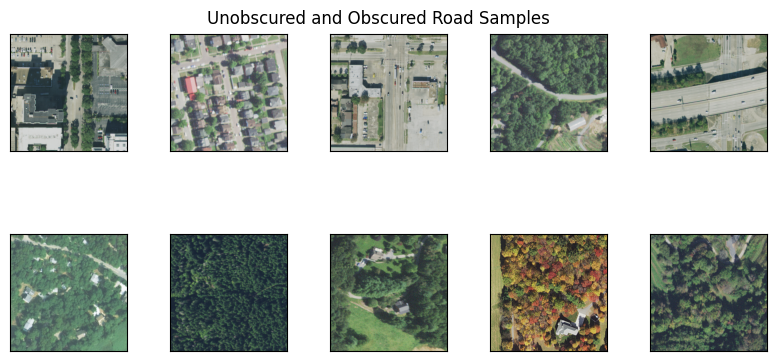

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import PIL.Image

# Take a random sample
n = 5
pos_s = pos_df.sample(n=n, random_state=1234)
neg_s = neg_df.sample(n=n, random_state=1234)

# Plot the samples
fig, ax = plt.subplots(2, n, figsize=(8, 4))
fig.tight_layout(pad=0)
fig.suptitle('Unobscured and Obscured Road Samples')

# Plot positive samples (unobscured)
for idx, ax_ in enumerate(ax[0]):
    im_path = pos_s.iloc[idx]['chip_path']
    im = np.array(PIL.Image.open(im_path))
    ax_.imshow(im[..., :3])

# Plot negative samples (nearly completely obscured)
for idx, ax_ in enumerate(ax[1]):
    im_path = neg_s.iloc[idx]['chip_path']
    im = np.array(PIL.Image.open(im_path))
    ax_.imshow(im[..., :3])

# Hide axis labels for plotted imagert
for ax_ in ax.flatten():  # type: ignore
    ax_.get_xaxis().set_visible(False)
    ax_.get_yaxis().set_visible(False)

# Delete samples
del n, pos_s, neg_s

Define a function `create_mask` that can generate a binary mask of a given width of the OSM way in the geospatial reference of each image chip.

In [3]:
from osgeo import ogr, osr
ogr.UseExceptions()

import PIL.Image
import PIL.ImageDraw

from rsc.common.utils import imread, imread_srs, imread_geotransform, map_to_pix

# Standard WGS-84 spatial reference
srs_ref = osr.SpatialReference()
srs_ref.ImportFromEPSG(4326)
srs_ref.SetAxisMappingStrategy(osr.OAMS_TRADITIONAL_GIS_ORDER)

def create_mask(row, width=2):    
    # Get list of points from WKT
    geom = ogr.CreateGeometryFromWkt(row['wkt'])
    pts = np.array(
        [geom.GetPoint_2D(idx) for idx in range(geom.GetPointCount())])
    lon_ar, lat_ar = pts[:, 0], pts[:, 1]

    # Get the image's geotransform
    xform = imread_geotransform(row['chip_path'])

    # Get the spatial reference (they change across the tiles)
    srs = osr.SpatialReference()
    srs.ImportFromProj4(imread_srs(row['chip_path']))
    srs.SetAxisMappingStrategy(osr.OAMS_TRADITIONAL_GIS_ORDER)
    im_trans = osr.CoordinateTransformation(srs_ref, srs)

    # Get list of points from WKT
    geom: ogr.Geometry = ogr.CreateGeometryFromWkt(row['wkt'])
    geom.Transform(im_trans)
    pts = np.array(
        [geom.GetPoint_2D(idx) for idx in range(geom.GetPointCount())])

    # Convert to image-space x, y
    ix, iy = map_to_pix(xform, pts[:, 0], pts[:, 1])  # type: ignore

    # Load image
    im = imread(row['chip_path'])

    # Create a new image of the same shape, and draw a line
    # to create a mask
    mask = np.zeros((im.shape[0], im.shape[1]), dtype=np.uint8)
    mask_pil = PIL.Image.new('L', ((im.shape[1], im.shape[0])), color=0)
    d = PIL.ImageDraw.Draw(mask_pil)
    d.line(
        [(x, y) for x, y in zip(ix, iy)],     # type: ignore
        fill=255,
        width=width, # Original: 10,
        joint="curve")
    mask = np.array(mask_pil)
    return im, mask

Define a function `avg_color`, in which, given an image chip and mask, we will fetch the road's color and convert it to [CIELAB](https://en.wikipedia.org/wiki/CIELAB_color_space) (somewhat perceptually uniform) space. The reason for this conversion is that distance between colors in this space has a more relevant meaning than RGB colors. In the end, this will give us a list of colors in a $(\mathrm{NIR}, L, a, b)$ (NIR = near-infrared) latent space. Finally, the geometric median of the road color points in this latent space will be computed and returned.

In [4]:
import skimage.color
from rsc.common.geometric_median import geometric_median

def avg_color(im, mask):
    im_where = im[np.where(mask)]
    im_irlab = np.hstack((
        im_where[..., (3,)] * (100.0 / 255),
        skimage.color.rgb2lab(im_where[..., (0, 1, 2)]).reshape((-1, 3))))
    avg_color_irlab = geometric_median(im_irlab)
    return avg_color_irlab


This code will give us an approximately even number of positive and negative road color samples.
- The positive samples are found using the geometric median approach described above.
- Negative samples are generated by sampling a random set of points in an image in which a road is completely obscured. This is a pretty-fair approach of sampling colors that are (most likely) not part of a road.

In [5]:
%matplotlib widget

from tqdm import tqdm

pos_sample_list = []
neg_sample_list = []

for idx in tqdm(range(len(pos_df))):
    row = pos_df.iloc[idx]
    
    # Gen positive sample
    im, mask = create_mask(row, width=2)
    pos_avg = avg_color(im, mask)
    pos_sample_list.append(pos_avg)

for idx in tqdm(range(len(neg_df))):
    row = neg_df.iloc[idx]
    
    # Get negative samples
    im, _ = create_mask(row, width=2)
    for _ in range(len(pos_df) // len(neg_df)):
        y, x = np.floor(np.random.random((2,)) * 256).astype(int)
        nir = im[y, x, 3] * (100.0 / 255)
        lab = skimage.color.rgb2lab(im[y, x, (0, 1, 2)])
        neg_sample_list.append((nir, *lab))


pos_sample_list = np.array(pos_sample_list)
neg_sample_list = np.array(neg_sample_list)

100%|██████████| 75/75 [00:00<00:00, 201.65it/s]


Our color samples are in a 4-dimensional latent space, but we will visualize the resulting positive and negative sample point clouds in CIELAB $a$- and $b$- space, which are the dimensions of color that the human eye percieves and neglects luminosity and the NIR response.

The separability between these point clouds is evident.

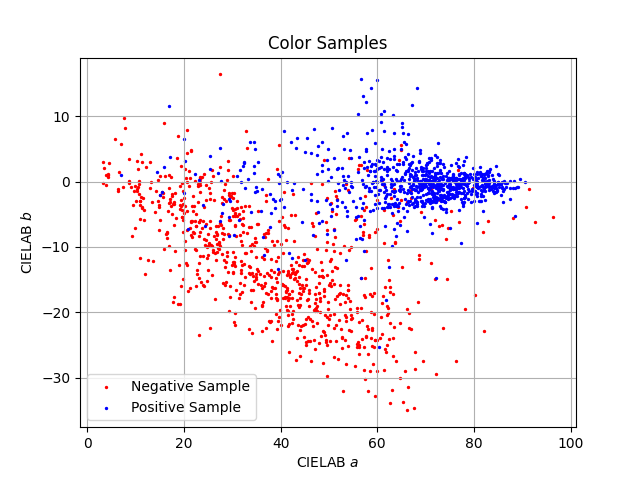

In [6]:
%matplotlib widget

fig, ax = plt.subplots()
ax.scatter(neg_sample_list[:, 1], neg_sample_list[:, 2], 2, color='r')  # type: ignore
ax.scatter(pos_sample_list[:, 1], pos_sample_list[:, 2], 2, color='b')  # type: ignore
ax.set_xlabel('CIELAB $a$')
ax.set_ylabel('CIELAB $b$')
ax.set_title('Color Samples')
ax.grid()
ax.legend(('Negative Sample', 'Positive Sample'))

So why not train a classifier on it? Here we setup a training set for scikit-learn:

In [7]:
# Prepare training set
X = np.vstack((pos_sample_list, neg_sample_list))
y = np.concatenate(([0] * len(pos_sample_list), [1] * len(neg_sample_list)))

# X is 4-D ->(IR, L, a, b)
display(X)

array([[ 57.51971461,  72.06683197,  -2.85081555,   3.99982615],
       [ 50.64530287,  71.31455623,   1.64365803,   1.0295951 ],
       [ 56.82893195,  66.50233098,   0.39109194,   1.15691855],
       ...,
       [ 76.8627451 ,  59.18590437, -27.82132115,  40.85438172],
       [ 50.58823529,  16.2547647 ,  -8.04001627,  14.56811359],
       [ 65.09803922,  49.69577173, -29.75549462,  38.19359052]])

And in 2 lines of code we have a classifier! We'll show the score on the training dataset:

In [8]:
from sklearn.linear_model import LogisticRegressionCV
clf = LogisticRegressionCV().fit(X, y)
clf.score(X, y)

0.9149438865918488

Woah. That rocks!

The choice of a logistic regression classifier was made because of its natural tendency to produce probabilities (confidences) without the need for further calibration. Ultimately we can use this to generate a pseudo-segmentation mask, where the confidence of our classifier is integrated.

Let's visualize the fit across each dimension:

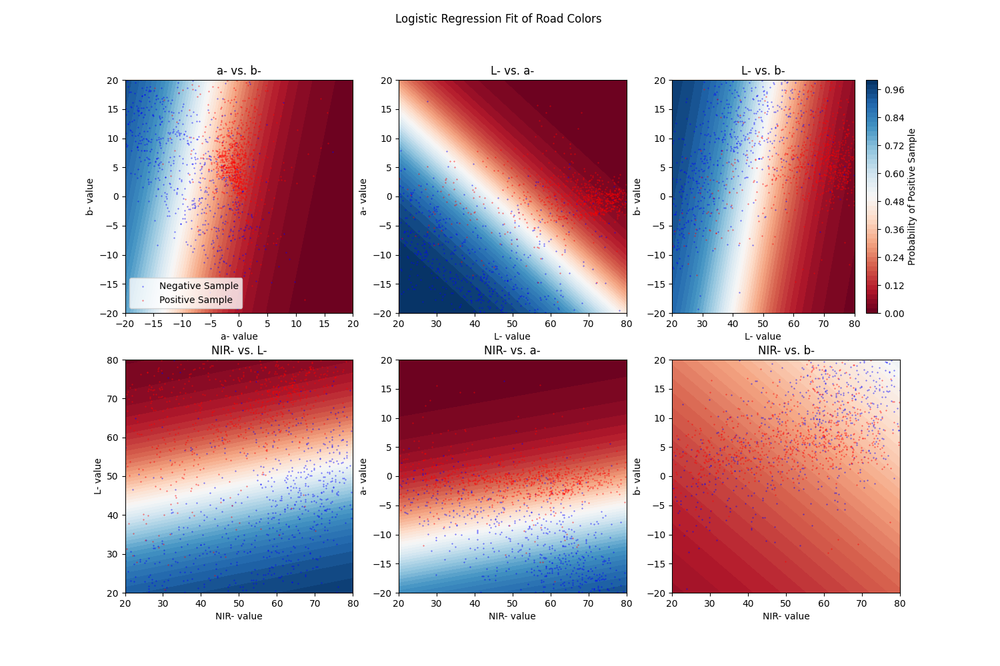

In [9]:
%matplotlib widget

import matplotlib.pyplot as plt
fig, ax = plt.subplots(2, 3, figsize=(15,10))
ax = ax.flatten()
fig.suptitle('Logistic Regression Fit of Road Colors ')
v = (y == 0)
pos, neg = X[v, ...], X[~v, ...]
sz = 0.1  # point size

# Median repeat helper
def med_r(X, idx, xx):
    return np.median(X[:, idx]).repeat(len(xx.ravel()))

# Grid 1: a vs b (both median IR and L)
# Grids 2-3 Median IR
# Grids 4-5 Median L

# Grid 1 -> Median L-, a- vs. b-
xx, yy = np.mgrid[-30:30:0.5, -30:30:0.5]
grid = np.c_[med_r(X, 0, xx), med_r(X, 1, xx), xx.ravel(), yy.ravel()]
probs = clf.predict_proba(grid)[:, 1].reshape(xx.shape)
ax[0].contourf(xx, yy, probs, 50, cmap="RdBu", vmin=0, vmax=1)
ax[0].scatter(neg[:, 2], neg[:, 3], sz, 'b', label='Negative Sample')
ax[0].scatter(pos[:, 2], pos[:, 3], sz, 'r', label='Positive Sample')
ax[0].set_xlim(-20, 20)
ax[0].set_ylim(-20, 20)
ax[0].set_title('a- vs. b-')
ax[0].set_xlabel('a- value')
ax[0].set_ylabel('b- value')
ax[0].legend()

# Grid 2 -> L- vs. a-, median b-
xx, yy = np.mgrid[0:100:0.5, -30:30:0.5]
grid = np.c_[med_r(X, 0, xx), xx.ravel(), yy.ravel(), med_r(X, 3, xx)]
probs = clf.predict_proba(grid)[:, 1].reshape(xx.shape)
ax[1].contourf(xx, yy, probs, 50, cmap="RdBu", vmin=0, vmax=1)
ax[1].scatter(neg[:, 1], neg[:, 2], sz, 'b')
ax[1].scatter(pos[:, 1], pos[:, 2], sz, 'r')
ax[1].set_xlim(20, 80)
ax[1].set_ylim(-20, 20)
ax[1].set_title('L- vs. a-')
ax[1].set_xlabel('L- value')
ax[1].set_ylabel('a- value')

# Grid 3 -> L- vs b-, median a-
xx, yy = np.mgrid[0:100:0.5, -30:30:0.5]
grid = np.c_[med_r(X, 0, xx), xx.ravel(), med_r(X, 2, xx), yy.ravel()]
probs = clf.predict_proba(grid)[:, 1].reshape(xx.shape)
c = ax[2].contourf(xx, yy, probs, 50, cmap="RdBu", vmin=0., vmax=1.)
ax[2].scatter(neg[:, 1], neg[:, 3], sz, 'b')
ax[2].scatter(pos[:, 1], pos[:, 3], sz, 'r')
ax[2].set_xlim(20, 80)
ax[2].set_ylim(-20, 20)
ax[2].set_title('L- vs. b-')
ax[2].set_xlabel('L- value')
ax[2].set_ylabel('b- value')

# Grid 4 -> IR- vs. L-, median a-, median b-
xx, yy = np.mgrid[0:100:0.5, 0:100:0.5]
grid = np.c_[xx.ravel(), yy.ravel(), med_r(X, 2, xx), med_r(X, 3, xx)]
probs = clf.predict_proba(grid)[:, 1].reshape(xx.shape)
ax[3].contourf(xx, yy, probs, 50, cmap="RdBu", vmin=0, vmax=1)
ax[3].scatter(neg[:, 0], neg[:, 1], sz, 'b')
ax[3].scatter(pos[:, 0], pos[:, 1], sz, 'r')
ax[3].set_xlim(20, 80)
ax[3].set_ylim(20, 80)
ax[3].set_title('NIR- vs. L-')
ax[3].set_xlabel('NIR- value')
ax[3].set_ylabel('L- value')

# Grid 5 -> IR- vs. a-, median b-
xx, yy = np.mgrid[0:100:0.5, -30:30:0.5]
grid = np.c_[xx.ravel(), med_r(X, 1, xx), yy.ravel(), med_r(X, 3, xx)]
probs = clf.predict_proba(grid)[:, 1].reshape(xx.shape)
ax[4].contourf(xx, yy, probs, 50, cmap="RdBu", vmin=0, vmax=1)
ax[4].scatter(neg[:, 0], neg[:, 2], sz, 'b')
ax[4].scatter(pos[:, 0], pos[:, 2], sz, 'r')
ax[4].set_xlim(20, 80)
ax[4].set_ylim(-20, 20)
ax[4].set_title('NIR- vs. a-')
ax[4].set_xlabel('NIR- value')
ax[4].set_ylabel('a- value')

# Grid 6 -> IR- vs b-, median a-
xx, yy = np.mgrid[0:100:0.5, -30:30:0.5]
grid = np.c_[xx.ravel(), med_r(X, 1, xx), med_r(X, 2, xx), yy.ravel()]
probs = clf.predict_proba(grid)[:, 1].reshape(xx.shape)
ax[5].contourf(xx, yy, probs, 50, cmap="RdBu", vmin=0., vmax=1.)
ax[5].scatter(neg[:, 0], neg[:, 3], sz, 'b')
ax[5].scatter(pos[:, 0], pos[:, 3], sz, 'r')
ax[5].set_xlim(20, 80)
ax[5].set_ylim(-20, 20)
ax[5].set_title('NIR- vs. b-')
ax[5].set_xlabel('NIR- value')
ax[5].set_ylabel('b- value')

fig.colorbar(c, ax=ax[2], label='Probability of Positive Sample')

Not bad, though the NIR vs. b- slice isn't excellent. Still, as we'll see, its results prove very helpful.

Let's generate some estimation function for the width of a road. This parameterization here is fairly arbitrary and ultimately doesn't matter if the segmentation results are good.

Note we are using 1m NAIP imagery, so 1 px = 1 meter.

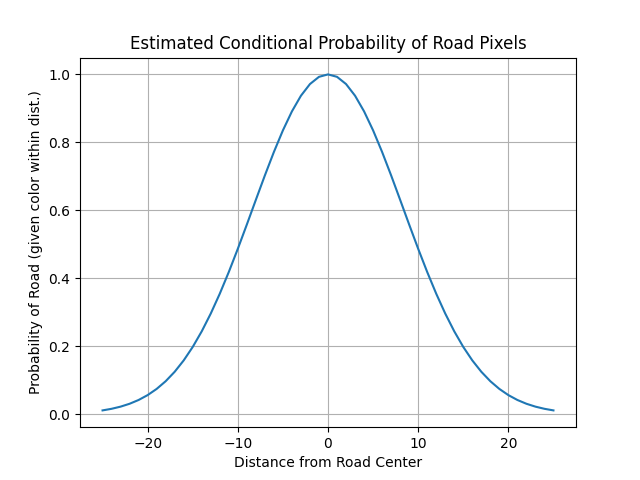

In [10]:
%matplotlib widget

from scipy.stats import norm

xlim = 25
sigma = xlim / 3
pdf_y = lambda x: norm.pdf(x, scale=sigma) * np.sqrt(2 * np.pi * sigma ** 2)

pdf_x = np.arange(-xlim, xlim + 1)
fig, ax = plt.subplots()
ax.plot(pdf_x, pdf_y(pdf_x))
ax.set_xlabel('Distance from Road Center')
ax.set_ylabel('Probability of Road (given color within dist.)')
ax.set_title('Estimated Conditional Probability of Road Pixels')
ax.grid()

Now that that's done, let's load some data!

In [11]:
import sqlite3
import pandas as pd
from IPython.display import display

# Connect to sqlite database and get all truthed roadways with no obscuration that are valid
with sqlite3.connect('file:/data/road_surface_classifier/features.sqlite3?mode=ro', uri=True) as con:
    cursor = con.cursor()
    cursor.execute("""
        SELECT osm_id, chip_path from features
        WHERE obscuration = -1 AND no_data = 0 and bad_detect = 0;
    """)
    rows = cursor.fetchall()

# Put this all in a dataframe
df = pd.DataFrame(rows, columns=['osm_id', 'chip_path']).set_index('osm_id')

# Load OSM features and extract WKT values for the OSM IDs from above
osm_df = pd.read_csv('/data/road_surface_classifier/features.csv')
osm_df = osm_df.set_index('osm_id').loc[df.index][['wkt', 'x', 'y']]

# Combine this with our original DataFrame to get a "super-duper" DataFrame with wkt values
df = pd.concat([df, osm_df], axis=1)
display(df)

,chip_path,wkt,x,y
osm_id,,,,
18250855,/data/road_surface_classifier/imagery/18250855...,"LINESTRING (-92.1110707 46.8673405,-92.1325183...",31987.980469,46171.644531
557603585,/data/road_surface_classifier/imagery/55760358...,"LINESTRING (-95.3910744 29.7243077,-95.3910989...",30804.613281,54192.378906
985683353,/data/road_surface_classifier/imagery/98568335...,"LINESTRING (-95.5234816 29.7505134,-95.5233766...",30756.496094,54181.253906
979952292,/data/road_surface_classifier/imagery/97995229...,"LINESTRING (-80.4055351 33.7118104,-80.4055288...",36260.238281,52486.886719
11180746,/data/road_surface_classifier/imagery/11180746...,"LINESTRING (-81.3570189 28.6101698,-81.3570119...",35914.312500,54656.812500
...,...,...,...,...
12550668,/data/road_surface_classifier/imagery/12550668...,"LINESTRING (-79.4810526 33.7405357,-79.4810279...",36597.484375,52473.953125
10160184,/data/road_surface_classifier/imagery/10160184...,"LINESTRING (-111.635913 38.992937,-111.6359837...",24887.011719,50121.093750
450305723,/data/road_surface_classifier/imagery/45030572...,"LINESTRING (-71.4058998 42.152198,-71.405813 4...",39537.695312,48580.906250


And we can define some helper functions:

In [12]:
from osgeo import ogr, osr
ogr.UseExceptions()

import PIL.Image
import PIL.ImageDraw

import skimage.draw

from rsc.common.utils import imread, imread_geotransform, imread_srs, map_to_pix

# Standard WGS-84 spatial reference
srs_ref = osr.SpatialReference()
srs_ref.ImportFromEPSG(4326)
srs_ref.SetAxisMappingStrategy(osr.OAMS_TRADITIONAL_GIS_ORDER)

def to_image_space(row):
    # Get list of points from WKT
    geom = ogr.CreateGeometryFromWkt(row['wkt'])
    pts = np.array(
        [geom.GetPoint_2D(idx) for idx in range(geom.GetPointCount())])
    lon_ar, lat_ar = pts[:, 0], pts[:, 1]

    # Get the image's geotransform
    xform = imread_geotransform(row['chip_path'])

    # Get the spatial reference (they change across the tiles)
    srs = osr.SpatialReference()
    srs.ImportFromProj4(imread_srs(row['chip_path']))
    srs.SetAxisMappingStrategy(osr.OAMS_TRADITIONAL_GIS_ORDER)
    im_trans = osr.CoordinateTransformation(srs_ref, srs)

    # Get list of points from WKT
    geom: ogr.Geometry = ogr.CreateGeometryFromWkt(row['wkt'])
    geom.Transform(im_trans)
    pts = np.array(
        [geom.GetPoint_2D(idx) for idx in range(geom.GetPointCount())])

    # Convert to image-space x, y
    ix, iy = map_to_pix(xform, pts[:, 0], pts[:, 1])

    # Load image
    im = imread(row['chip_path'])

    return im, ix, iy

def create_mask_from_image_space(im, ix, iy, width=2, scale=4):
    # Create a new image of the same shape, and draw a line
    # to create a mask
    mask = np.zeros((im.shape[0], im.shape[1]), dtype=np.uint8)
    mask_pil = PIL.Image.new('L', ((im.shape[1] * scale, im.shape[0] * scale)), color=0)
    d = PIL.ImageDraw.Draw(mask_pil)
    d.line(
        [(x * scale, y * scale) for x, y in zip(ix, iy)],     # type: ignore
        fill=255,
        width=width * scale,
        joint="curve")
    mask_pil = mask_pil.resize((im.shape[0], im.shape[1]), PIL.Image.Resampling.LANCZOS)
    mask = np.array(mask_pil)
    return mask

def create_mask(row, width=2):    
    im, ix, iy = to_image_space(row)
    mask = create_mask_from_image_space(im, ix, iy, width)
    return im, mask

And ultimately we can combine the data to form masks here. Essentially, the way this works is to use edge detection to estimate the width of a road, and then we use our color model to generate a fine segmentation mask over that area.

The results are honestly excellent, given the alternative is manual truthing of these segmentation masks. Can't complain!

Of course, if we wish to improve segmentation performance down the road, we could augment this with human-generated truth data.

100%|██████████| 10/10 [00:02<00:00,  4.84it/s]


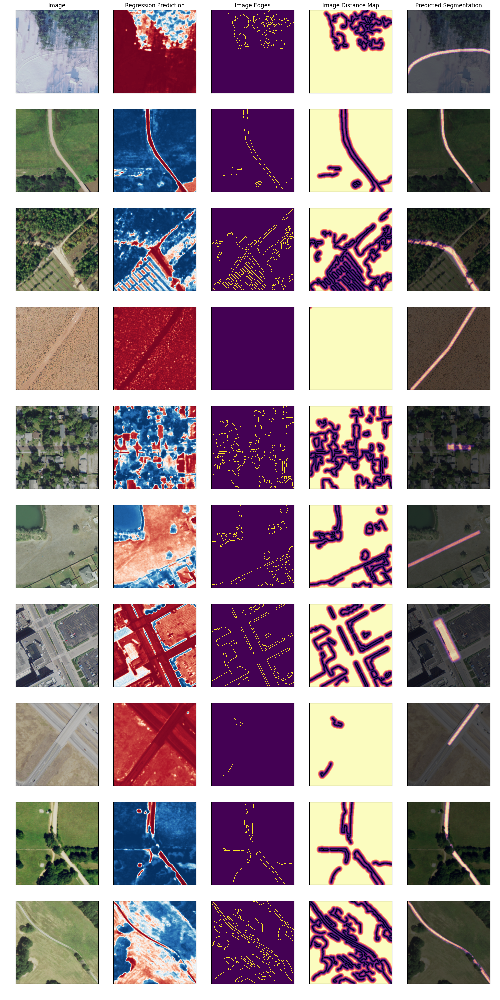

In [13]:
%matplotlib widget

from tqdm import tqdm
import scipy.ndimage
from scipy.special import erf
import skimage.color
import skimage.feature
import skimage.morphology

rows, cols = 10, 5
fig, ax = plt.subplots(rows, cols, figsize=(3 * cols, 3 * rows), sharex=True, sharey=True)
fig.tight_layout()
for ax_ in ax.flatten():  # type: ignore
    ax_.get_xaxis().set_visible(False)
    ax_.get_yaxis().set_visible(False)

cmap = 'RdBu_r'

pdf_y = lambda x, sigma: norm.pdf(x, scale=sigma) * np.sqrt(2 * np.pi * sigma ** 2)

s = df.sample(frac=1, random_state=44).reset_index(drop=True) # random_state=43
s = s.iloc[:rows]
for idx in tqdm(range(len(s))):
    row = s.iloc[idx]

    # Load the image and create a mask around the middle of the road
    im, mask = create_mask(row, width=2)

    # Convert to LAB + NIR and predict using the model
    im_irlab = np.dstack((
        im[..., (3,)] * (100.0 / 255),
        skimage.color.rgb2lab(im[..., (0, 1, 2)])))
    pred = clf.predict_proba(im_irlab.reshape(-1, 4))[:, 0]
    pred = pred.reshape((im.shape[0], im.shape[1]))

    # Blur it a little bit
    pred_clf = scipy.ndimage.gaussian_filter(pred, sigma=1)

    # Use canny edges + distance transform to estimate road width
    edges = skimage.feature.canny(pred_clf, sigma=2)
    edges = ~skimage.morphology.area_closing(~edges, 50, connectivity=2)
    dist: np.ndarray = scipy.ndimage.distance_transform_edt(~edges)  # type: ignore

    # Test for physcially-realistic answer
    # < 2 lanes or > 6 lanes, assuming 10ft wide lanes on average
    w = 2 * np.median(dist[np.where(mask)]).astype(int)
    if (w < 3 or w > 23):
        w = 6 # assume two lane road

    # Update the mask with our new width
    _, mask = create_mask(row, width=w)

    # Fit a probability assuming a normal distribution and our width is 3-sigma from the mean
    dist_m: np.ndarray = scipy.ndimage.distance_transform_edt(~mask)  # type: ignore
    dist_pdf = pdf_y(dist_m.reshape((-1,)), w / 3.0).reshape(dist_m.shape)

    # Update prediction. This is our final probability mask
    pred = pred_clf * dist_pdf

    # Plot
    ax[idx][0].imshow(im[..., :3])
    ax[idx][1].imshow(pred_clf, cmap=cmap, vmin=0, vmax=1)
    ax[idx][2].imshow(edges, vmin=0, vmax=1, interpolation='none')
    ax[idx][3].imshow(dist, vmin=0, vmax=10, cmap='magma')
    ax[idx][4].imshow(im[:, :, (0, 1, 2)])
    ax[idx][4].imshow(pred, cmap='magma', vmin=0, vmax=1, alpha=0.6)

    for i, title in enumerate(('Image', 'Regression Prediction', 'Image Edges', 'Image Distance Map', 'Predicted Segmentation')):
        ax[0][i].set_title(title)



The following code was just used to help me make masks to train the model with. I dub them "probmasks" for "probability masks".

In [14]:
import pathlib
from rsc.common.utils import wgs84_to_im
from rsc.common.utils import map_to_pix, imread, imread_geotransform, imread_srs, imwrite

# Load features dataframe
df = pd.read_csv(str('/data/road_surface_classifier/features.csv'))
out_path = pathlib.Path('/data/road_surface_classifier/probmasks/')
if out_path.is_dir():
    raise ValueError('Will not create output masks...')

# Chip path
def get_chip_path(row):
    chip_path = pathlib.Path('/data/road_surface_classifier/imagery/') / f'{row["osm_id"]}.tif'
    assert chip_path.exists()
    return chip_path    
df['chip_path'] = df.apply(get_chip_path, axis=1)

# Standard WGS-84 spatial reference
srs_ref = osr.SpatialReference()
srs_ref.ImportFromEPSG(4326)
srs_ref.SetAxisMappingStrategy(osr.OAMS_TRADITIONAL_GIS_ORDER)

# Mask creation loop
print('Creating masks from OSM data...')
for idx in tqdm(range(len(df))):

    # Load in row
    row = df.iloc[idx]

    # Load the image and create a mask around the middle of the road
    im, mask = create_mask(row, width=2)

    # Convert to LAB + NIR and predict using the model
    im_irlab = np.dstack((
        im[..., (3,)] * (100.0 / 255),
        skimage.color.rgb2lab(im[..., (0, 1, 2)])))
    pred = clf.predict_proba(im_irlab.reshape(-1, 4))[:, 0]
    pred = pred.reshape((im.shape[0], im.shape[1]))

    # Blur it a little bit
    pred_clf = scipy.ndimage.gaussian_filter(pred, sigma=1)

    # Use canny edges + distance transform to estimate road width
    edges = skimage.feature.canny(pred_clf, sigma=2)
    edges = ~skimage.morphology.area_closing(~edges, 50, connectivity=2)
    dist: np.ndarray = scipy.ndimage.distance_transform_edt(~edges)  # type: ignore

    # Test for physcially-realistic answer
    # < 2 lanes or > 6 lanes, assuming 10ft wide lanes on average
    w = 2 * np.median(dist[np.where(mask)]).astype(int)
    if (w < 3 or w > 23):
        w = 6 # assume two lane road

    # Update the mask with our new width
    _, mask = create_mask(row, width=w)

    # Fit a probability assuming a normal distribution and our width is 3-sigma from the mean
    dist_m: np.ndarray = scipy.ndimage.distance_transform_edt(~mask)  # type: ignore
    dist_pdf = pdf_y(dist_m.reshape((-1,)), w / 3.0).reshape(dist_m.shape)

    # Update prediction. This is our final probability mask
    pred = ((pred_clf * dist_pdf) * 255.0).astype(np.uint8)

    # Save the mask
    out_file = out_path / row['osm_id']
    imwrite(pred, out_file)

ValueError: Will not create output masks...